## Task 2

In [20]:
import numpy as np
import scipy.signal
from scipy.signal import fftconvolve

def eval_diff_eq(x: np.ndarray, b_coeffs: np.ndarray, a_coeffs: np.ndarray, max_out: int) -> np.ndarray:
    if x.size < max_out:
        x = np.concat((x, np.zeros(max_out - x.size)))
    moving_avg = fftconvolve(b_coeffs, x)

    padding_len = a_coeffs.size
    padded_y = np.zeros(padding_len + max_out)
    for n in range(max_out):
        auto_regressive = np.dot(a_coeffs, np.flip(padded_y[n:n + padding_len]))
        padded_y[padding_len + n] = moving_avg[n] - auto_regressive

    return padded_y[padding_len:]

Input signal: $x(n) = \{1, 2, 0, 2, 1\}$
\begin{align*}
(b_0, \dots, b_2) = (\frac{1}{4}, \frac{1}{2}, \frac{1}{4}) \\
a_1 = \frac{1}{2}
\end{align*}

\begin{align*}
y(0) &= b_0 x(0) &&= \frac{1}{4} \cdot 1 &&= \frac{1}{4} \\
y(1) &= b_0 x(1) + b_1 x(0) - a_1 y(0) &&= \frac{1}{4} \cdot 2 + \frac{1}{2} \cdot 1 - \frac{1}{2} \cdot \frac{1}{4} &&= \frac{7}{8} \\
y(2) &= b_0 x(2) + b_1 x(1) + b_2 x(0) - a_1 y(1) &&= \frac{1}{4} \cdot 0 + \frac{1}{2} \cdot 2 + \frac{1}{4} \cdot 1 - \frac{1}{2} \cdot \frac{7}{8} &&= \frac{13}{16} \\
y(3) &= b_0 x(3) + b_1 x(2) + b_2 x(1) - a_1 y(2) &&= \frac{1}{4} \cdot 2 + \frac{1}{2} \cdot 0 + \frac{1}{4} \cdot 2 - \frac{1}{2} \cdot \frac{13}{16} &&= \frac{19}{32} \\
y(4) &= b_0 x(4) + b_1 x(3) + b_2 x(2) - a_1 y(3) &&= \frac{1}{4} \cdot 1 + \frac{1}{2} \cdot 2 + \frac{1}{4} \cdot 0 - \frac{1}{2} \cdot \frac{19}{32} &&= \frac{61}{64} \\
y(5) &= b_1 x(4) + b_2 x(3) - a_1 y(4) &&= \frac{1}{2} \cdot 1 + \frac{1}{4} \cdot 2 - \frac{1}{2} \cdot \frac{61}{64} &&= \frac{67}{128} \\
\end{align*}

In [21]:
x = np.array([1, 2, 0, 2, 1], dtype="float64")
b_coeffs = np.array([0.25, 0.5, 0.25])
a_coeffs = np.array([0.5])
print(eval_diff_eq(x, b_coeffs, a_coeffs, 6))

[0.25      0.875     0.8125    0.59375   0.953125  0.5234375]


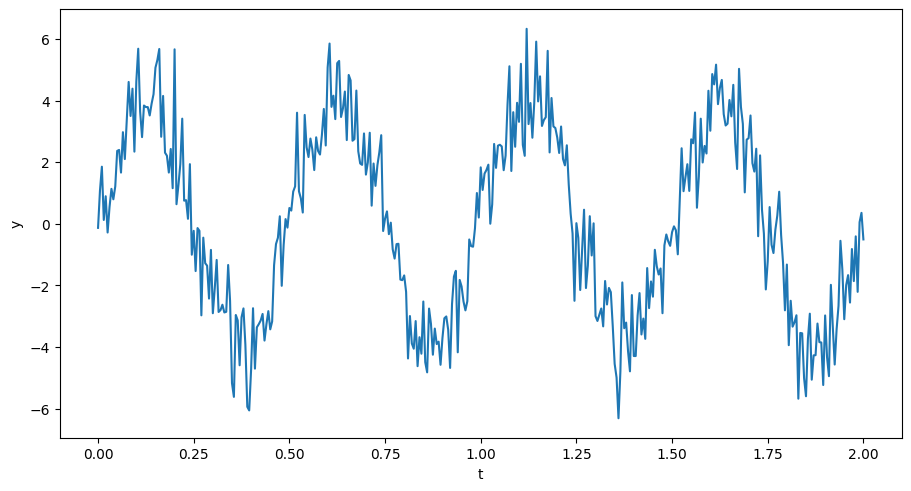

In [22]:
#%matplotlib widget
import matplotlib.pyplot as plt

def plot(t, y, title, xlabel="t", ylabel="y", *args):
    plt.plot(t, y, *args)
    #plt.title(title)
    plt.xlabel(xlabel)
    plt.ylabel(ylabel)
    plt.gcf().set_figwidth(9)

fs = 200
N = 2 * fs + 1
t = np.linspace(0, 2, N)
x = 4 * np.sin(2 * 2 * np.pi * t)

rng = np.random.default_rng()
x_noisy = x + rng.standard_normal(t.shape)

plt.figure(constrained_layout=True)
plot(t, x_noisy, "noisy sine wave")

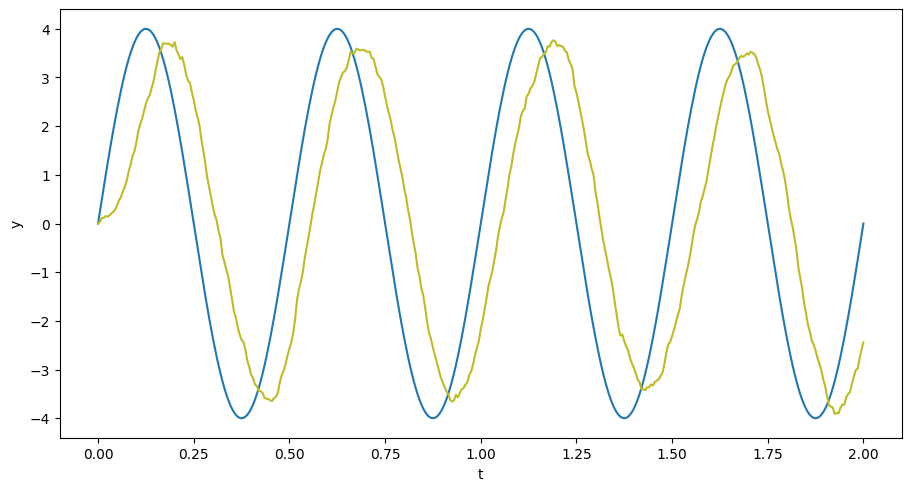

In [23]:
d = 25
b_coeffs = np.full(d, 1 / d)
a_coeffs = np.empty(0)
x_smoothed = eval_diff_eq(x_noisy, b_coeffs, a_coeffs, t.size)

plt.figure(constrained_layout=True)
plot(t, x, "noisy/smoothed sine wave")
plot(t, x_smoothed, "noisy/smoothed sine wave", "t", "y", "tab:olive")

The values of $b_k$ have to be $1/d$. That is how an average over $d$ values is computed. A value of $d = 25$ strikes a compromise between elimination of noise and similarity to the original signal in terms of amplitude and phase.

Text(0, 0.5, 'y')

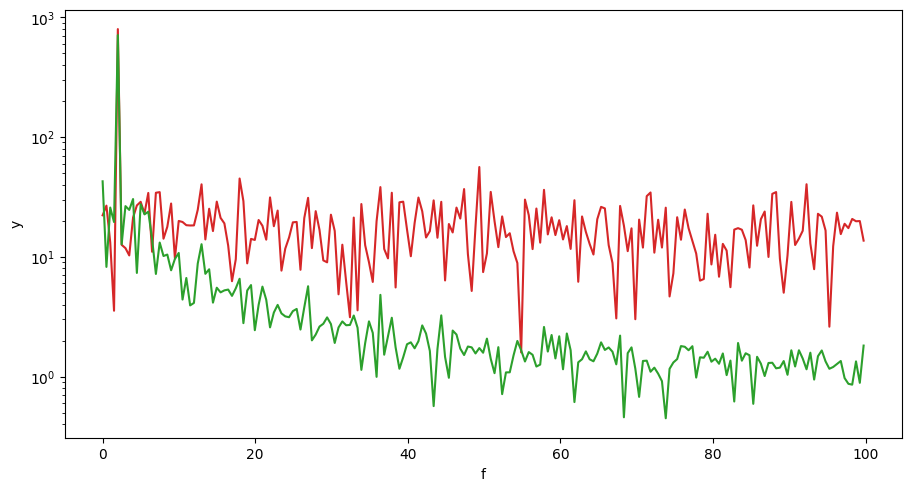

In [24]:
spectrum_noisy = np.abs(np.fft.rfft(x_noisy))
spectrum_smoothed = np.abs(np.fft.rfft(x_smoothed))

freqs = np.fft.rfftfreq(N, 1 / fs)
plt.figure(constrained_layout=True).set_figwidth(9)
ax = plt.gca()
ax.semilogy(freqs, spectrum_noisy, "tab:red")
ax.semilogy(freqs, spectrum_smoothed, "tab:green")
#plt.title("DFT of noisy/smoothed sine wave")
plt.xlabel("f")
plt.ylabel("y")

In [25]:
from IPython.display import Audio
import soundfile as sf

speech_input, speech_fs = sf.read("media/speech1.wav", dtype="int16")

MAX_AMPL = 0x8000
display(Audio(speech_input / MAX_AMPL, rate=speech_fs, normalize=False))

In [26]:
coeffs = np.load("coeffs.npz")
b_coeffs, a_coeffs = coeffs["b_coeffs"], coeffs["a_coeffs"]
print(f"b_coeffs: {b_coeffs}\na_coeffs: {a_coeffs}")

speech_output = eval_diff_eq(speech_input, b_coeffs, a_coeffs, speech_input.size)

display(Audio(speech_output / MAX_AMPL, rate=speech_fs, normalize=False))

b_coeffs: [0.00101375 0.01013752 0.04561883 0.12165021 0.21288787 0.25546544
 0.21288787 0.12165021 0.04561883 0.01013752 0.00101375]
a_coeffs: [-1.24505755e+00  1.99552120e+00 -1.45956779e+00  1.07283362e+00
 -4.73961282e-01  1.86753487e-01 -4.65430541e-02  9.03027448e-03
 -9.81660576e-04  5.45332668e-05]


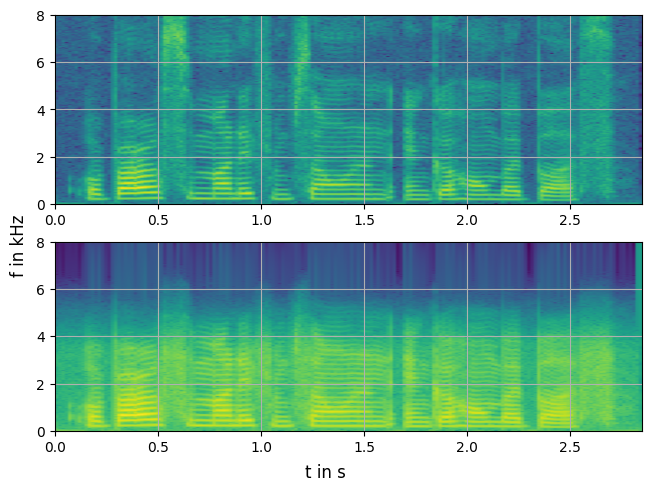

In [37]:
def stft_comparison(input_vals, output_vals, fs):
    f_in, t, Zxx_in = scipy.signal.stft(input_vals, fs, nperseg=fs * 0.032)
    f_out, t, Zxx_out = scipy.signal.stft(output_vals, fs, nperseg=fs * 0.032)
    fig, (ax1, ax2) = plt.subplots(nrows=2, constrained_layout=True)
    fig.supxlabel("t in s")
    fig.supylabel("f in kHz")

    ax1.imshow(np.log(np.abs(Zxx_in)), aspect="auto", origin="lower", extent=(t[0], t[-1], f_in[0]/1000, f_in[-1]/1000))
    ax1.grid()

    ax2.imshow(np.log(np.abs(Zxx_out)), aspect="auto", origin="lower", extent=(t[0], t[-1], f_out[0]/1000, f_out[-1]/1000))
    ax2.grid()

stft_comparison(speech_input, speech_output, speech_fs)

The given system is a low-pass filter.

## Task 3

In [28]:
def convolve_sequences(x: np.ndarray, h: np.ndarray) -> np.ndarray:
    if h.size > x.size:
        return convolve_sequences(h, x)

    padded_x = np.concat((np.zeros(h.size - 1), x, np.zeros(h.size - 1)))
    rev_h = np.flip(h)

    ret = np.zeros(x.size + h.size - 1)
    sum_len = h.size
    for n in range(ret.size):
        ret[n] = np.dot(padded_x[n:n + sum_len], rev_h)
    return ret

Text(0, 0.5, 'y')

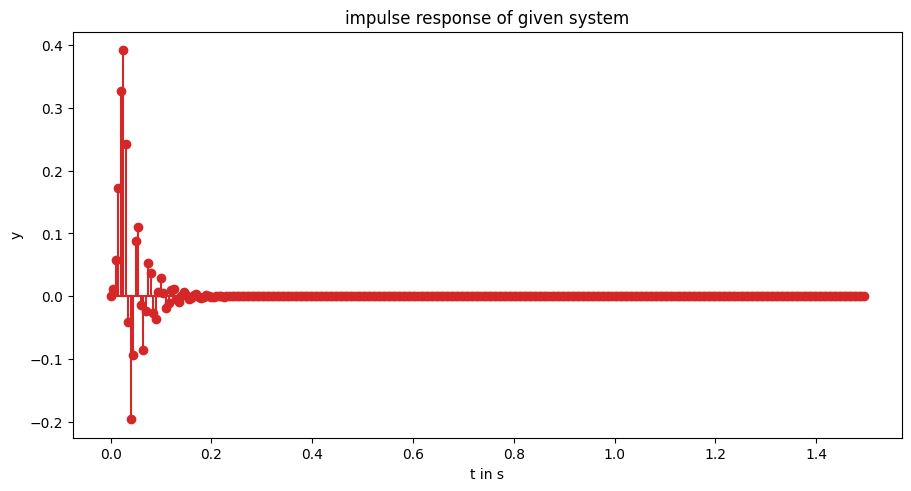

In [42]:
impulse_response = eval_diff_eq(np.ones(1), b_coeffs, a_coeffs, 300)
plt.figure(constrained_layout=True).set_figwidth(9)
plt.stem(np.arange(300) / fs, impulse_response, "tab:red")
plt.title("impulse response of given system")
plt.xlabel("t in s")
plt.ylabel("y")

In [30]:
speech_output2 = convolve_sequences(speech_input, impulse_response)
speech_output3 = scipy.signal.fftconvolve(speech_input, impulse_response)

print("(ARMA vs convolution) mean absolute error:", np.mean(np.abs(speech_output - speech_output2[:speech_input.size])))
print("(ARMA vs convolution) largest error:", np.max(np.abs(speech_output - speech_output2[:speech_input.size])))

print("(ARMA vs fast convolution) mean absolute error:", np.mean(np.abs(speech_output - speech_output3[:speech_input.size])))
print("(ARMA vs fast convolution) largest error:", np.max(np.abs(speech_output - speech_output3[:speech_input.size])))

(ARMA vs convolution) mean absolute error: 2.425376010708855e-13
(ARMA vs convolution) largest error: 5.9117155615240335e-12
(ARMA vs fast convolution) mean absolute error: 2.414299837919026e-13
(ARMA vs fast convolution) largest error: 5.6843418860808015e-12


An advantage of the ARMA equation is that only a couple of coeffecients were necessary. Because the system is not purely a Moving Average system, the impulse response is infinite, which means that a high amount of impulse response samples might be necessary in order to achieve accurate results.

An advantage of the impulse response method is that it does not have to be calculated in a specific order, which means that it can be parallelized.

In [31]:
church_impulse_response, church_fs = sf.read("media/normalized_church_ir.wav", dtype="int16")
song_input, song_fs = sf.read("media/mini-christmas-song.wav", dtype="int16")

print(np.min(song_input), np.max(song_input))
display(Audio(church_impulse_response / MAX_AMPL, rate=church_fs, normalize=False))
display(Audio(song_input / MAX_AMPL, rate=song_fs, normalize=False))

-32768 32767


In [32]:
from scipy.signal import fftconvolve

assert church_fs == song_fs
song_output = fftconvolve(song_input, church_impulse_response / MAX_AMPL)

display(Audio(song_output, rate=song_fs))

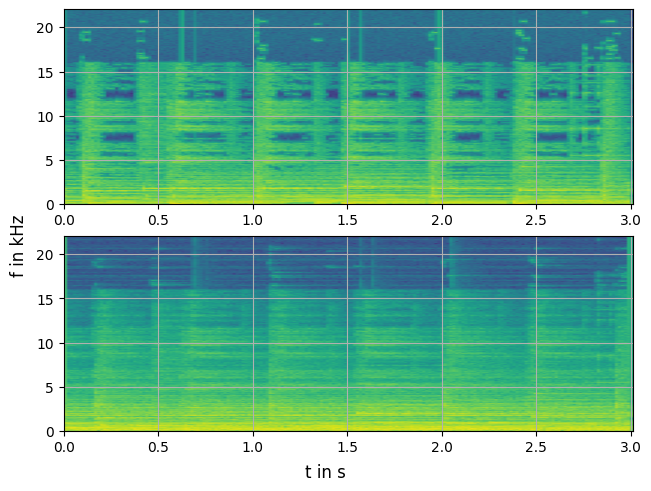

In [40]:
start_n = 5 * song_fs
end_n = 8 * song_fs
stft_comparison(song_input[start_n:end_n], song_output[start_n:end_n], song_fs)

The main effect is that the audio is blurred (to the right).

The audio is slightly delayed by the system. There are larger peaks than there were previously, which makes the IPython player play the audio less loudly.

## Task 4

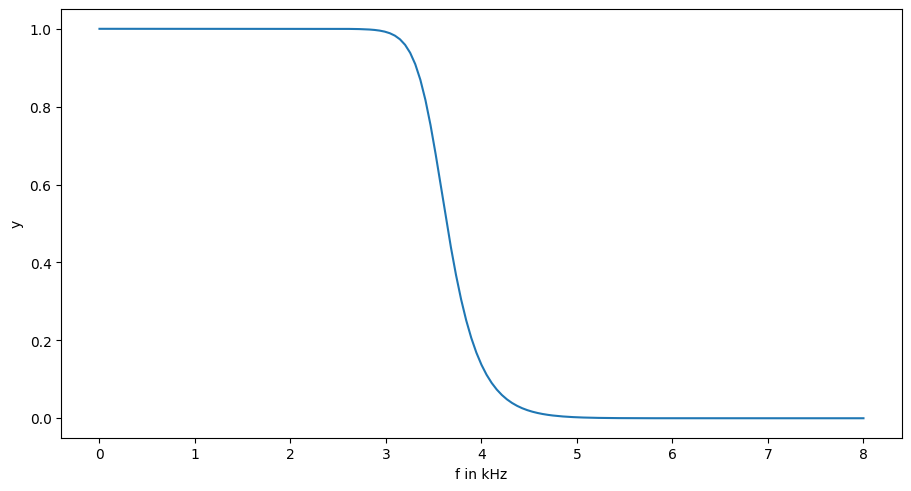

In [41]:
# impulse_response = eval_diff_eq(np.ones(1), b_coeffs, a_coeffs, 3000)
sys_freq_response = np.fft.rfft(impulse_response)
freqs = np.fft.rfftfreq(impulse_response.size, 1 / speech_fs)

plt.figure(constrained_layout=True)
plot(freqs / 1000, np.abs(sys_freq_response), "frequency response of low-pass filter", xlabel="f in kHz", ylabel="y")

In [35]:
speech_freq_response = np.fft.rfft(speech_input)

interp_sys_freq_response = np.interp(
	np.linspace(0, sys_freq_response.size, speech_freq_response.size, endpoint=False),
	np.arange(0, sys_freq_response.size),
	sys_freq_response,
)
speech_output_dft = np.fft.irfft(speech_freq_response * interp_sys_freq_response, speech_input.size)

print("(ARMA vs DFT multiplication) mean absolute error:", np.mean(np.abs(speech_output - speech_output_dft)))
print("(ARMA vs DFT multiplication) largest error:", np.max(np.abs(speech_output - speech_output_dft)))

display(Audio(speech_output_dft / MAX_AMPL, rate=speech_fs, normalize=False))

(ARMA vs DFT multiplication) mean absolute error: 1.178223747918503
(ARMA vs DFT multiplication) largest error: 24.171164263593255


We can only do a component-wise multiplication of the two frequency response vectors if they have the same length. To achieve this, we interpolate the frequency response of the system to have more values.

The large error mainly stems from the fact that we cut off the impulse response after 300 samples.